In [1]:
import pandas as pd
import numpy as np
import seaborn
import matplotlib
import statistics
from sklearn.decomposition import PCA
from sklearn.decomposition import KernelPCA
from sklearn.manifold import TSNE
from sklearn.manifold import MDS
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
import math
import glob
from itertools import combinations
from matplotlib import pyplot as plt
from Bio import Phylo
import biotite
from pca_plot import *
from vst_function import *
from stattools.resampling import PermutationTest

In [2]:
## Read and merge files 
anotation = pd.read_csv('../data/SGDP_anotation.csv', sep=',', encoding='latin-1')

ids_hg19 = pd.DataFrame()
ids_hg19['SAMPLE'] = anotation['3-Illumina_ID']
ids_hg19['REGION'] = anotation['10-Region']


In [3]:
def read_file(file):
    """
    Read a file to a dict of lists.

    :param str file: Path to a sample file.
    :return: dict of lists of records
    :rtype: dict
    """
    vcf_dict = []
    #df = pd.DataFrame()
    with open(file, 'r') as invcf:
        for line in invcf:
            if line.startswith('track'):
                continue
                
    
    
            line = line.strip().split()
            CHR = line[0]
            START = line[1]
            END = line[2]
            SCORE = line[3]
            name = str(file.split('/')[-1]) 
            
            if SCORE == '2':
                continue
            
            vcf_dict.append([name, CHR, START,END, SCORE])
            
            
    return vcf_dict



def read_multiple_files(path_of_files):
    """
    Read the path of vcf files to a dataframe.
    :param str file: Path to a files.
    :return: dict of lists of  records
    :rtype: dict
    """
    files = glob.glob(path_of_files+'*')
    chm13list = []
    for file in files:
        #return pd.DataFrame(read_vcf(file))
        chm13list.append(read_file(file))
    
    return (chm13list)


df = read_multiple_files('../data/CHM13_SGDP/')


In [4]:
Output = []
  
# Using iteration
for temp in df:
    for elem in temp:
        Output.append(elem)


In [5]:
chm13 = pd.DataFrame(Output)

chm13.columns = ['SAMPLE', 'CHR', 'START', 'END', 'SCORE']
chm13['START'] = chm13['START'].astype(int)
chm13['END'] = chm13['END'].astype(int)
chm13['SCORE'] = chm13['SCORE'].astype(int)

#chm13.to_csv('t2tchm13_cnvs.csv')
## Keeping only samples that are on old cnvs 
chm13 = chm13.merge(ids_hg19, on=['SAMPLE'])


chm13


,SAMPLE,CHR,START,END,SCORE,REGION
0,LP6005442-DNA_A11,CP068254.1,0,1000,836,WestEurasia
1,LP6005442-DNA_A11,CP068254.1,1000,2228,884,WestEurasia
2,LP6005442-DNA_A11,CP068254.1,2228,3378,798,WestEurasia
3,LP6005442-DNA_A11,CP068254.1,3378,4522,811,WestEurasia
4,LP6005442-DNA_A11,CP068254.1,4522,5522,905,WestEurasia
...,...,...,...,...,...,...
35659700,LP6005441-DNA_B09,CP086569.2,62447554,62448825,25,EastAsia
35659701,LP6005441-DNA_B09,CP086569.2,62448825,62449825,27,EastAsia
35659702,LP6005441-DNA_B09,CP086569.2,62449825,62450825,29,EastAsia
35659703,LP6005441-DNA_B09,CP086569.2,62450825,62451825,27,EastAsia


In [6]:
## ADDING DUPLICATION/DELETION COLUMN 
deletions = chm13[chm13['SCORE'] < 2 ] 
deletions['TYPE'] = 'DELETION'
duplications= chm13[chm13['SCORE'] > 2] 
duplications['TYPE'] = 'DUPLICATION'

frames = [deletions,duplications]

chm13 = pd.concat(frames)
chm13

/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_24187/4183408819.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deletions['TYPE'] = 'DELETION'
/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_24187/4183408819.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  duplications['TYPE'] = 'DUPLICATION'


,SAMPLE,CHR,START,END,SCORE,REGION,TYPE
17,LP6005442-DNA_A11,CP068255.2,79662,98643,1,WestEurasia,DELETION
18,LP6005442-DNA_A11,CP068255.2,105118,116978,1,WestEurasia,DELETION
20,LP6005442-DNA_A11,CP068255.2,158982,162403,1,WestEurasia,DELETION
24,LP6005442-DNA_A11,CP068255.2,169811,172183,1,WestEurasia,DELETION
25,LP6005442-DNA_A11,CP068255.2,176466,178147,1,WestEurasia,DELETION
...,...,...,...,...,...,...,...
35659700,LP6005441-DNA_B09,CP086569.2,62447554,62448825,25,EastAsia,DUPLICATION
35659701,LP6005441-DNA_B09,CP086569.2,62448825,62449825,27,EastAsia,DUPLICATION
35659702,LP6005441-DNA_B09,CP086569.2,62449825,62450825,29,EastAsia,DUPLICATION
35659703,LP6005441-DNA_B09,CP086569.2,62450825,62451825,27,EastAsia,DUPLICATION


In [7]:
### Getting gene anotation to filtering 
header_list = ['CHR','START', 'END', 'NAME', 'SCORE', 'STRAND', 'END-2', 'END-3', 'TYPE_CODE','BLOCKS', 'LENGTH', 'NORELATIVE'] 
gene_anotation = pd.read_table('../data/gene_anotation_chm13', names = header_list)
#gene_anotation = gene_anotation[gene_anotation['TYPE']=='76,85,212'] # only selecting protein-coding genes

feature_table = pd.read_table('../data/GCF_009914755.1_T2T-CHM13v2.0_feature_table.txt')#, index_col='chr

report = pd.read_table('../data/GCF_009914755.1_T2T-CHM13v2.0_assembly_report.txt')

chm13_gene_anotation = feature_table.merge(report, left_on='genomic_accession', right_on='RefSeq-Accn')
chm13_gene_anotation[chm13_gene_anotation['class'] == 'protein_coding']
gene_anotation = pd.DataFrame()
gene_anotation['CHR'] = chm13_gene_anotation['GenBank-Accn']
gene_anotation['START'] = chm13_gene_anotation['start']
gene_anotation['END'] = chm13_gene_anotation['end']
gene_anotation['CHR_2'] = chm13_gene_anotation['chromosome'] 

chromosome_anotation = pd.DataFrame()
chromosome_anotation['CHR'] = chm13_gene_anotation['GenBank-Accn']
chromosome_anotation['chr'] = chm13_gene_anotation['chromosome']
chromosome_anotation = chromosome_anotation.drop_duplicates()
chromosome_anotation

/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_24187/3429419454.py:6: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  feature_table = pd.read_table('../data/GCF_009914755.1_T2T-CHM13v2.0_feature_table.txt')#, index_col='chr


,CHR,chr
0,CP068277.2,1
21900,CP068276.2,2
38230,CP068275.2,3
52163,CP068274.2,4
61798,CP068273.2,5
72316,CP068272.2,6
84206,CP068271.2,7
95857,CP068270.2,8
104865,CP068269.2,9
114357,CP068268.2,10


In [8]:
#chm13 = pd.read_csv('../data/chm13_gene_regions.csv', index_col=0)
chm13['LENGHT'] = chm13['END'] - chm13['START']
chm13['TYPE'].value_counts()

DUPLICATION    24637132
DELETION       11022573
Name: TYPE, dtype: int64

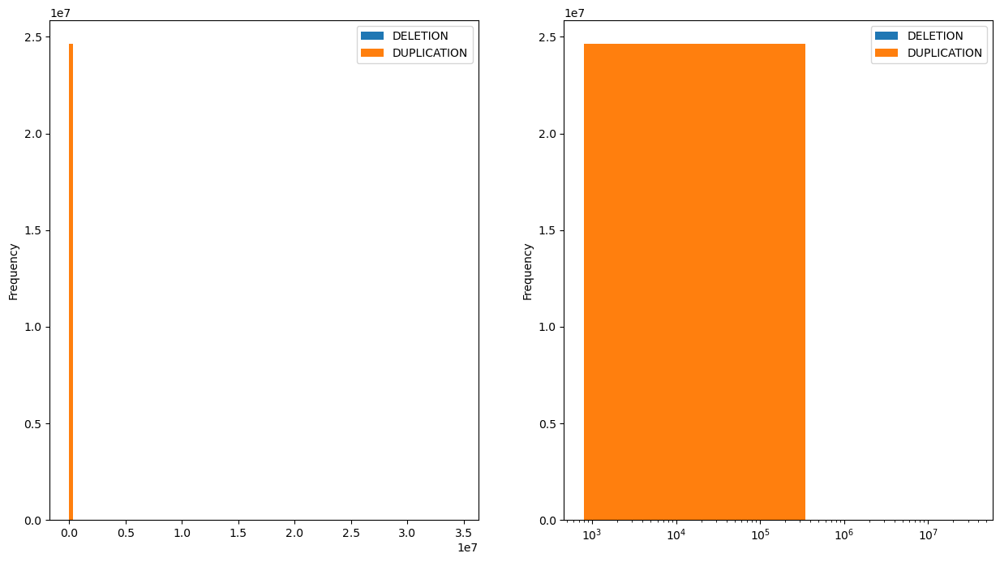

In [9]:
fig, axs = plt.subplots(1, 2, figsize=(15, 8))

df_plot= chm13.groupby(['TYPE'])['LENGHT']

df_plot.plot(kind='hist',stacked=True, bins=100, legend=True, ax=axs[0]) # alpha for transparency

plt.xscale('log')
#plt.show()

df_plot = chm13.groupby(['TYPE'])['LENGHT']

df_plot.plot(kind='hist',stacked=True, bins=100, legend=True, ax=axs[1]) # alpha for transparency

plt.show()

In [10]:
#subsetting deletions and duplications
deletions = chm13[chm13['TYPE'] =='DELETION']
duplications = chm13[chm13['TYPE'] == 'DUPLICATION']

In [11]:
#change to df when using telomeres and centromeres filtration
final_cnv = chm13.pivot_table(index=["CHR", "START", "END"], 
                    columns='SAMPLE', 
                    values='SCORE').reset_index()


final_cnv

SAMPLE,CHR,START,END,LP6005441-DNA_A01,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,LP6005441-DNA_A09,...,LP6005677-DNA_D03,LP6005677-DNA_E01,LP6005677-DNA_F01,LP6005677-DNA_G01,LP6007068-DNA_A01,LP6007069-DNA_A01,SS6004471,SS6004477,SS6004478,SS6004480
0,CP068254.1,0,1000,755.0,729.0,817.0,921.0,947.0,792.0,695.0,...,91.0,728.0,847.0,217.0,171.0,217.0,725.0,731.0,1022.0,227.0
1,CP068254.1,1000,2228,778.0,741.0,836.0,946.0,989.0,814.0,717.0,...,93.0,759.0,879.0,226.0,179.0,223.0,773.0,754.0,1135.0,243.0
2,CP068254.1,2228,3378,703.0,704.0,780.0,885.0,936.0,765.0,670.0,...,82.0,696.0,829.0,205.0,155.0,197.0,708.0,684.0,1024.0,221.0
3,CP068254.1,3378,4522,724.0,706.0,799.0,898.0,945.0,784.0,687.0,...,85.0,735.0,845.0,214.0,168.0,211.0,735.0,709.0,1085.0,228.0
4,CP068254.1,4522,5522,795.0,762.0,868.0,972.0,1025.0,838.0,742.0,...,90.0,766.0,901.0,219.0,177.0,225.0,791.0,766.0,1182.0,241.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1014252,CP086569.2,62447554,62448825,18.0,24.0,22.0,22.0,19.0,23.0,25.0,...,25.0,17.0,21.0,24.0,24.0,23.0,19.0,21.0,22.0,23.0
1014253,CP086569.2,62448825,62449825,19.0,25.0,22.0,24.0,21.0,25.0,27.0,...,25.0,19.0,22.0,25.0,24.0,23.0,19.0,22.0,22.0,24.0
1014254,CP086569.2,62449825,62450825,21.0,27.0,24.0,26.0,21.0,25.0,29.0,...,27.0,20.0,24.0,26.0,27.0,27.0,23.0,26.0,26.0,26.0
1014255,CP086569.2,62450825,62451825,20.0,26.0,23.0,25.0,21.0,24.0,27.0,...,26.0,19.0,22.0,25.0,28.0,28.0,22.0,27.0,26.0,28.0


In [22]:
d = chromosome_anotation.merge(final_cnv, on='CHR')
d = d.drop(columns='CHR')
d = d.fillna(2)
d.to_csv('../data/t2tchm13_all_pivot.bed', sep='\t', header=False, index=False )

In [23]:
columns = d.columns
np.savetxt("../data/t2tchm13_all_pivot_names.bed", columns,
           delimiter ="/t", 
           fmt ='% s')

In [21]:
from scipy import stats
#final_cnv = final_cnv.iloc[new]
final = final_cnv.iloc[:,3:284]
counts = final
counts = counts.fillna(2)

#counts = counts[counts.columns.intersection(counts_a.columns)]

#counts = counts.drop(columns=['LP6005592-DNA_G03',
#                     'LP6005443-DNA_E10',
#                     'LP6005442-DNA_E04'])

counts = counts.T
counts = counts.sort_index()
counts

,0,1,2,3,4,5,6,7,8,9,...,1014247,1014248,1014249,1014250,1014251,1014252,1014253,1014254,1014255,1014256
SAMPLE,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A01,755.0,778.0,703.0,724.0,795.0,816.0,800.0,824.0,827.0,824.0,...,5.0,5.0,4.0,13.0,18.0,18.0,19.0,21.0,20.0,20.0
LP6005441-DNA_A03,729.0,741.0,704.0,706.0,762.0,788.0,778.0,790.0,788.0,800.0,...,7.0,5.0,4.0,17.0,23.0,24.0,25.0,27.0,26.0,27.0
LP6005441-DNA_A04,817.0,836.0,780.0,799.0,868.0,874.0,867.0,883.0,891.0,894.0,...,6.0,5.0,4.0,14.0,20.0,22.0,22.0,24.0,23.0,24.0
LP6005441-DNA_A05,921.0,946.0,885.0,898.0,972.0,1060.0,1027.0,1039.0,1052.0,1047.0,...,7.0,5.0,4.0,15.0,21.0,22.0,24.0,26.0,25.0,24.0
LP6005441-DNA_A06,947.0,989.0,936.0,945.0,1025.0,1051.0,1042.0,1062.0,1068.0,1078.0,...,5.0,4.0,3.0,13.0,18.0,19.0,21.0,21.0,21.0,23.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,217.0,223.0,197.0,211.0,225.0,244.0,229.0,225.0,215.0,249.0,...,7.0,4.0,3.0,16.0,18.0,23.0,23.0,27.0,28.0,26.0
SS6004471,725.0,773.0,708.0,735.0,791.0,857.0,827.0,877.0,763.0,895.0,...,6.0,3.0,2.0,14.0,15.0,19.0,19.0,23.0,22.0,23.0
SS6004477,731.0,754.0,684.0,709.0,766.0,806.0,792.0,850.0,723.0,868.0,...,7.0,5.0,4.0,16.0,18.0,21.0,22.0,26.0,27.0,27.0


In [22]:
features = ids_hg19.set_index('SAMPLE').merge(counts, left_index=True, right_index=True)
features = features.loc[:,['REGION']]
features = features.sort_index()
features 

,REGION
SAMPLE,
LP6005441-DNA_A01,WestEurasia
LP6005441-DNA_A03,Oceania
LP6005441-DNA_A04,America
LP6005441-DNA_A05,WestEurasia
LP6005441-DNA_A06,WestEurasia
...,...
LP6007069-DNA_A01,WestEurasia
SS6004471,Africa
SS6004477,Oceania


In [23]:
#PCA

x = StandardScaler().fit_transform(counts)
pca = PCA(n_components=10)
pca_results = pca.fit_transform(x)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5',
                                  'component_6',
                                  'component_7',
                                  'component_8',
                                  'component_9',
                                   'component_10'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)
df_pca

,REGION,component_1,component_2,component_3,component_4,component_5,component_6,component_7,component_8,component_9,component_10
SAMPLE,,,,,,,,,,,
LP6005441-DNA_A01,WestEurasia,-38.055552,40.419198,23.106976,-172.253162,-18.266489,-35.722910,-0.975209,-14.435768,1.125131,-30.492567
LP6005441-DNA_A03,Oceania,-52.946378,-97.592979,-74.632116,257.992340,-8.057278,19.363921,-46.773212,-21.452907,-2.574658,-19.100379
LP6005441-DNA_A04,America,-51.613391,-98.546755,-64.357370,262.709826,-5.533195,19.508978,-48.440092,-29.505891,-3.816894,-45.182762
LP6005441-DNA_A05,WestEurasia,-37.383653,40.121357,12.427586,-172.326546,-16.718783,-30.587280,0.792101,-12.699759,2.091116,-18.431206
LP6005441-DNA_A06,WestEurasia,-39.832780,35.295396,26.795333,-164.636340,-18.575559,-37.375536,-0.518586,-13.097143,-2.109837,-64.619822
...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,WestEurasia,-65.652019,-90.469334,-79.790096,256.435828,435.316755,201.165134,-29.268829,927.294128,23.913078,125.543421
SS6004471,Africa,-57.052313,60.895415,24.734492,-324.579562,2338.352571,920.163254,399.576447,-689.960274,-8.647754,24.127795
SS6004477,Oceania,-44.627264,44.517253,41.527314,-194.347035,325.363317,92.287565,30.277458,551.099464,-3.095940,-25.523940


In [24]:
pca.explained_variance_ratio_

array([0.35401775, 0.06121971, 0.06041812, 0.05068793, 0.02767096,
       0.02636253, 0.02477567, 0.01460956, 0.01204441, 0.00862505])

             component_1  component_2  component_3  component_4  component_5  \
REGION                                                                         
WestEurasia   -38.055552    40.419198    23.106976  -172.253162   -18.266489   
Oceania       -52.946378   -97.592979   -74.632116   257.992340    -8.057278   
America       -51.613391   -98.546755   -64.357370   262.709826    -5.533195   
WestEurasia   -37.383653    40.121357    12.427586  -172.326546   -16.718783   
WestEurasia   -39.832780    35.295396    26.795333  -164.636340   -18.575559   
...                  ...          ...          ...          ...          ...   
WestEurasia   -65.652019   -90.469334   -79.790096   256.435828   435.316755   
Africa        -57.052313    60.895415    24.734492  -324.579562  2338.352571   
Oceania       -44.627264    44.517253    41.527314  -194.347035   325.363317   
Oceania       -70.267834   -96.881528   -68.778608   275.189974   453.802248   
Africa        -42.018451    56.886214   

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  figure = matplotlib.pyplot.figure(


             component_1  component_2  component_3  component_4  component_5  \
REGION                                                                         
WestEurasia   -38.055552    40.419198    23.106976  -172.253162   -18.266489   
Oceania       -52.946378   -97.592979   -74.632116   257.992340    -8.057278   
America       -51.613391   -98.546755   -64.357370   262.709826    -5.533195   
WestEurasia   -37.383653    40.121357    12.427586  -172.326546   -16.718783   
WestEurasia   -39.832780    35.295396    26.795333  -164.636340   -18.575559   
...                  ...          ...          ...          ...          ...   
WestEurasia   -65.652019   -90.469334   -79.790096   256.435828   435.316755   
Africa        -57.052313    60.895415    24.734492  -324.579562  2338.352571   
Oceania       -44.627264    44.517253    41.527314  -194.347035   325.363317   
Oceania       -70.267834   -96.881528   -68.778608   275.189974   453.802248   
Africa        -42.018451    56.886214   

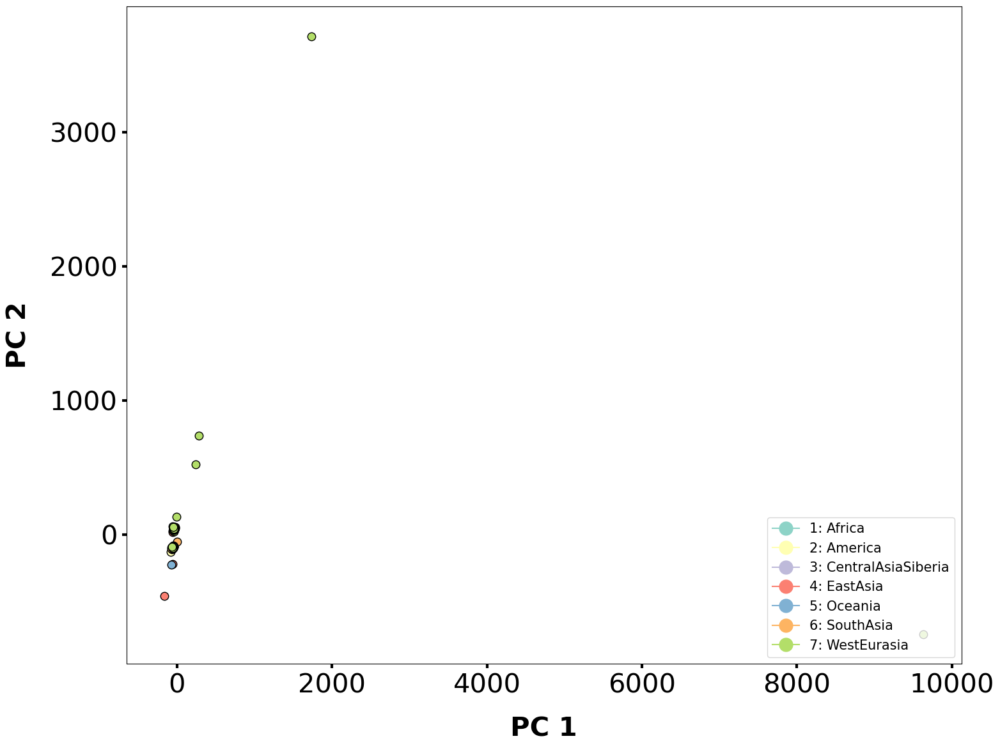

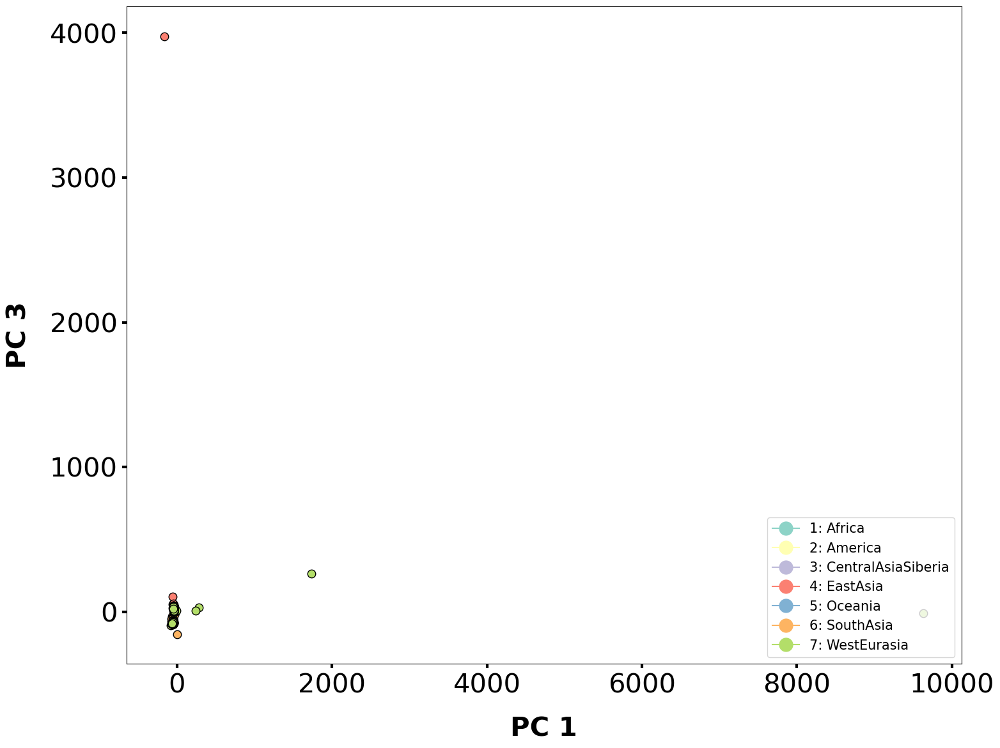

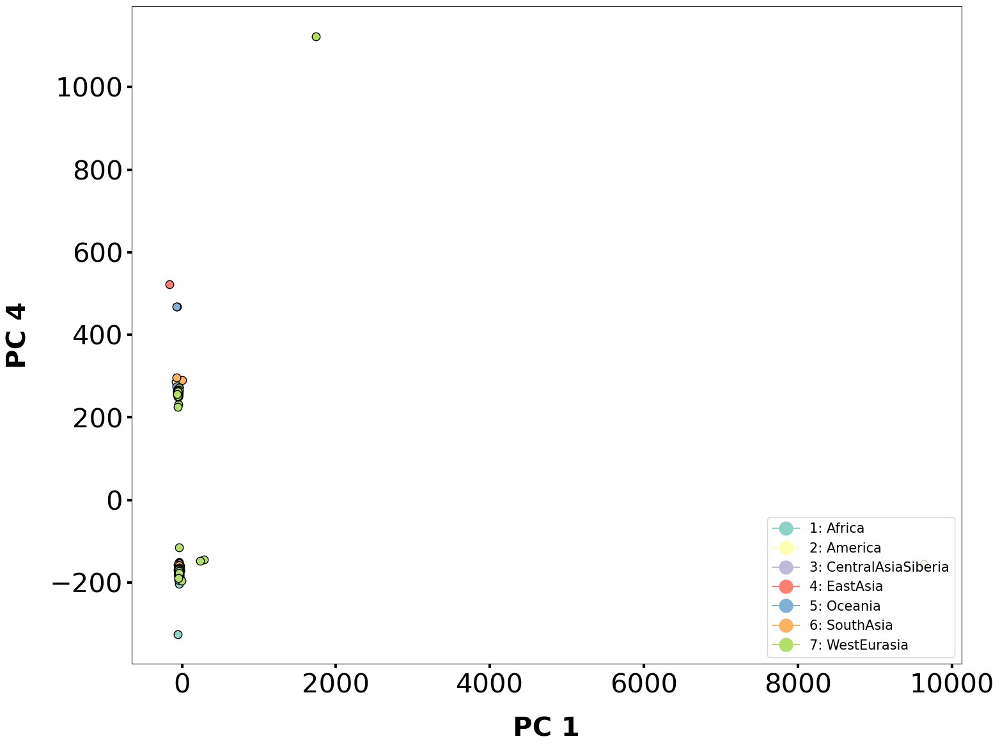

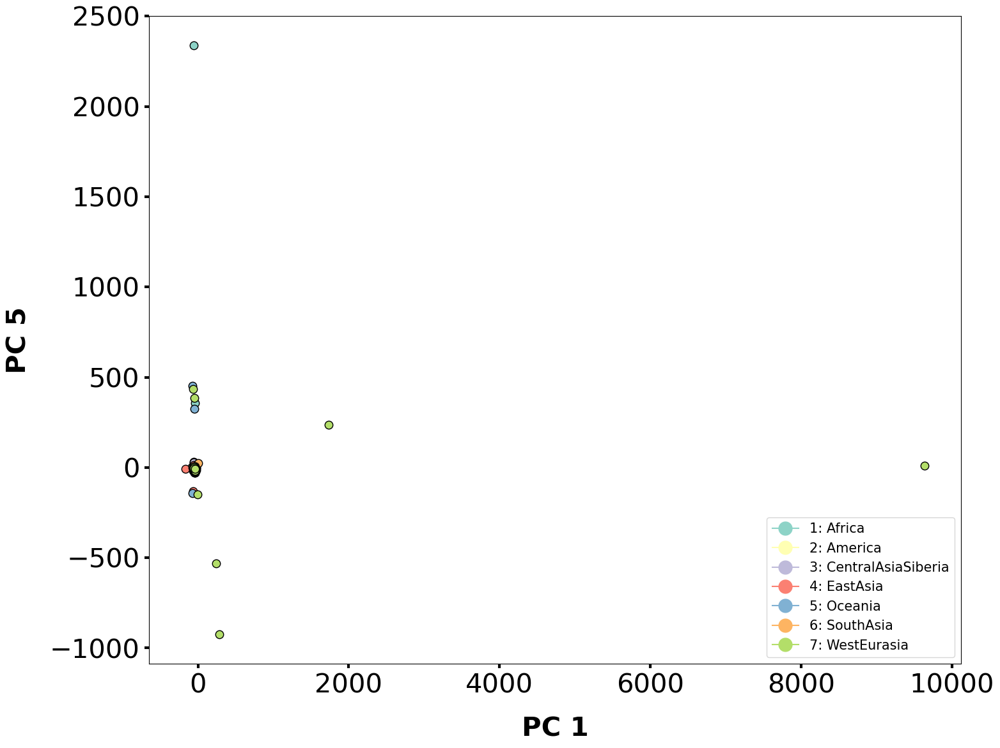

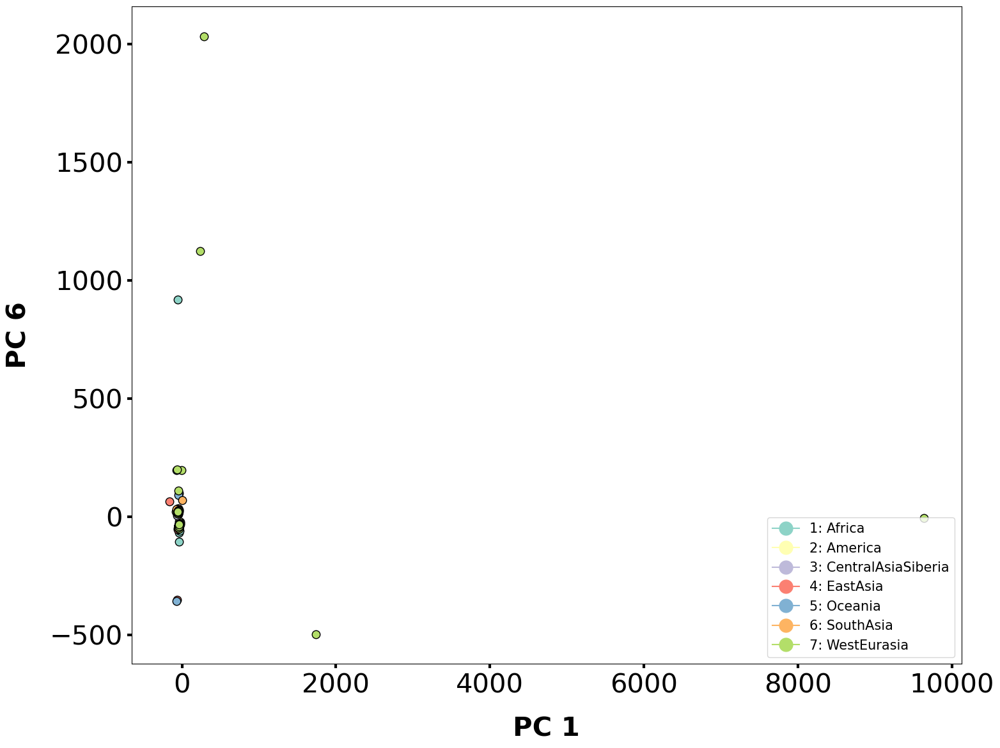

...

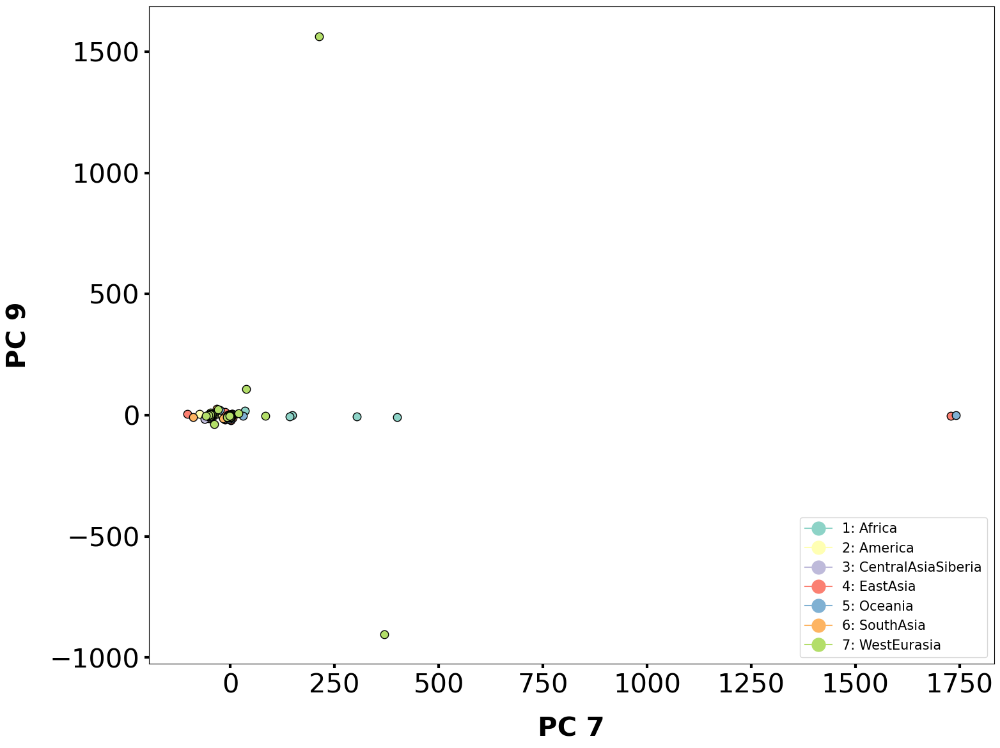

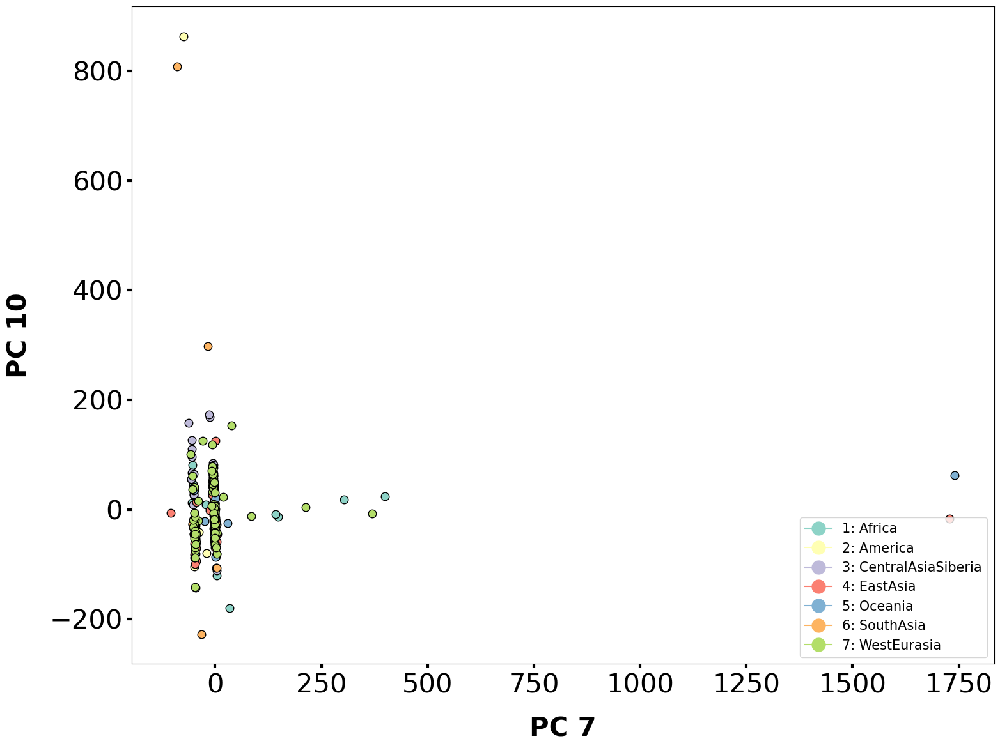

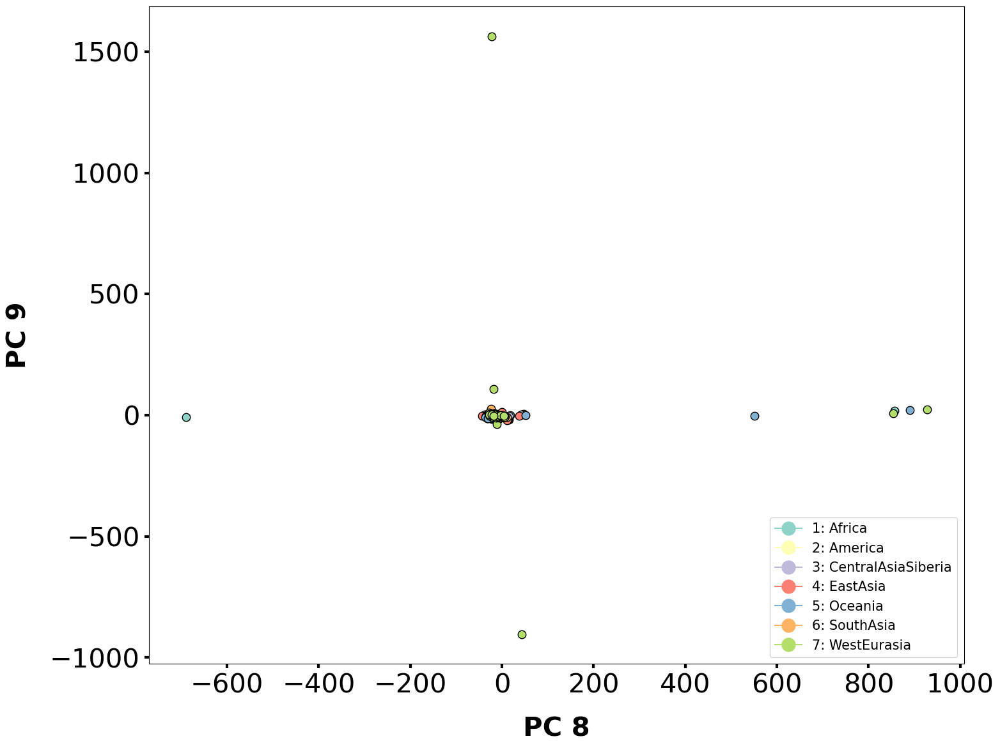

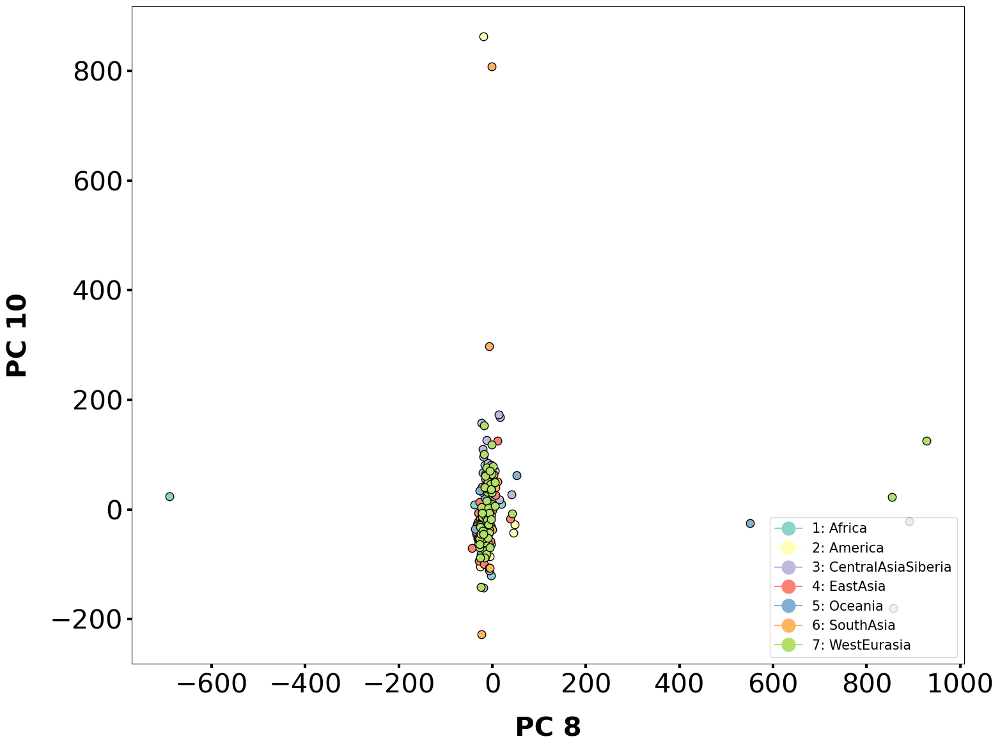

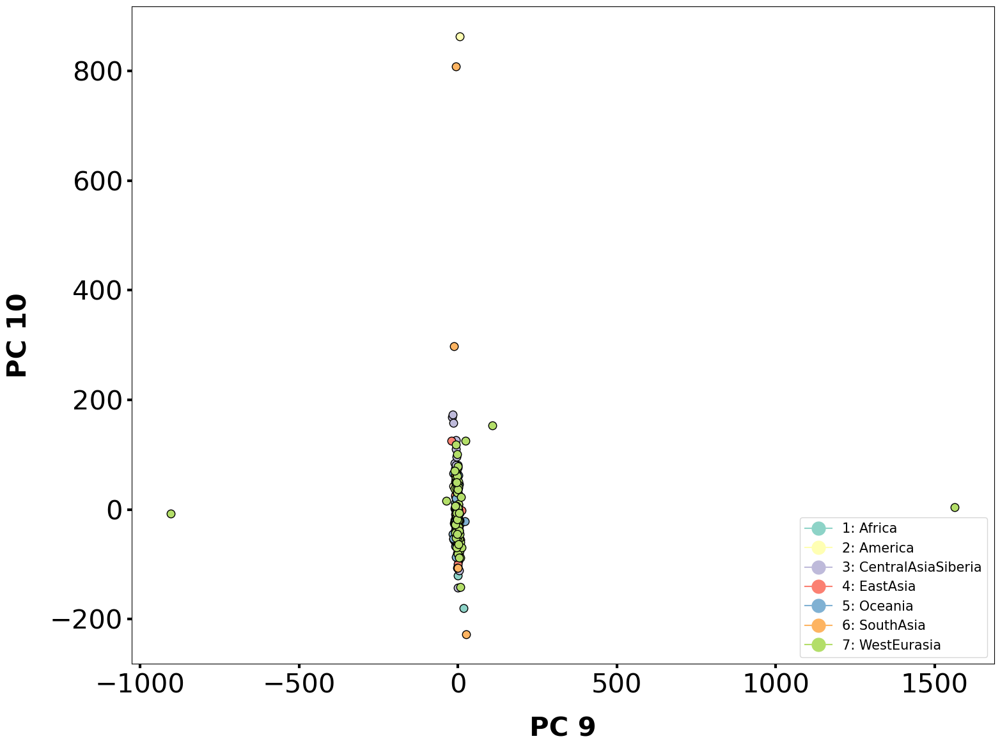

In [25]:
components = [1,2,3,4,5,6,7,8,9,10]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='REGION', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))
#    plot_scatter_cluster(data=df_pca, abscissa='component_8', ordinate='component_9', label_horizontal='Component 1', label_vertical='Component 3', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    

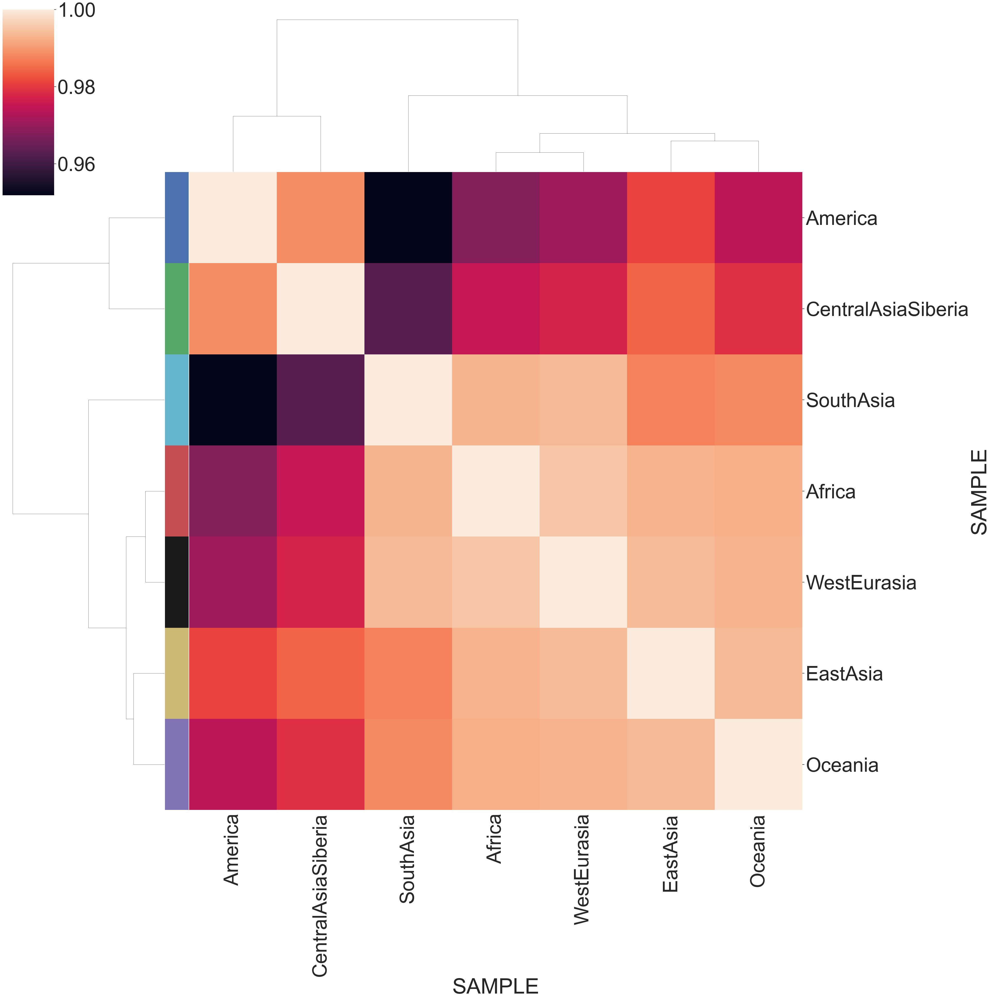

In [26]:
freq = final_cnv.iloc[:,3:283]
freq_input = freq.rename(columns=features['REGION'])
df = freq_input.T
#df = df.reset_index()

#df.groupby('SAMPLE').count().div(df.groupby('SAMPLE').size(),0)


df = df.notnull().groupby(level=0).mean()

df = df.T

lut = dict(zip(df.columns.unique(), "rbgymck"))
lut

seaborn.set(font_scale=5)
corrmatrix = df.corr(method='pearson')
row_colors = df.columns.map(lut)
seaborn.clustermap(corrmatrix, row_colors=row_colors, row_cluster=True, figsize=(40,40))
#plt.savefig('clustermap_regions.pdf')

In [27]:

feature_table = pd.read_table('../data/GCF_009914755.1_T2T-CHM13v2.0_feature_table.txt')#, index_col='chr

report = pd.read_table('../data/GCF_009914755.1_T2T-CHM13v2.0_assembly_report.txt')

/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_21841/2876646236.py:1: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  feature_table = pd.read_table('../data/GCF_009914755.1_T2T-CHM13v2.0_feature_table.txt')#, index_col='chr


In [28]:
chm13_gene_anotation = feature_table.merge(report, left_on='genomic_accession', right_on='RefSeq-Accn')
chm13_gene_anotation[chm13_gene_anotation['class'] == 'protein_coding']
chm13_gene_anotation


,# feature,class,assembly,assembly_unit,seq_type,chromosome,genomic_accession,start,end,strand,...,Sequence-Name,Sequence-Role,Assigned-Molecule,Assigned-Molecule-Location/Type,GenBank-Accn,Relationship,RefSeq-Accn,Assembly-Unit,Sequence-Length,UCSC-style-name
0,gene,protein_coding,GCF_009914755.1,Primary Assembly,chromosome,1,NC_060925.1,11134,37628,-,...,1,assembled-molecule,1,Chromosome,CP068277.2,=,NC_060925.1,Primary Assembly,248387328,na
1,mRNA,NaN,GCF_009914755.1,Primary Assembly,chromosome,1,NC_060925.1,11134,37628,-,...,1,assembled-molecule,1,Chromosome,CP068277.2,=,NC_060925.1,Primary Assembly,248387328,na
2,CDS,with_protein,GCF_009914755.1,Primary Assembly,chromosome,1,NC_060925.1,13463,37628,-,...,1,assembled-molecule,1,Chromosome,CP068277.2,=,NC_060925.1,Primary Assembly,248387328,na
3,gene,lncRNA,GCF_009914755.1,Primary Assembly,chromosome,1,NC_060925.1,20892,23710,-,...,1,assembled-molecule,1,Chromosome,CP068277.2,=,NC_060925.1,Primary Assembly,248387328,na
4,ncRNA,lncRNA,GCF_009914755.1,Primary Assembly,chromosome,1,NC_060925.1,20892,23710,-,...,1,assembled-molecule,1,Chromosome,CP068277.2,=,NC_060925.1,Primary Assembly,248387328,na
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236307,gene,protein_coding,GCF_009914755.1,Primary Assembly,chromosome,Y,NC_060948.1,62446549,62449392,+,...,Y,assembled-molecule,Y,Chromosome,CP086569.2,=,NC_060948.1,Primary Assembly,62460029,na
236308,mRNA,NaN,GCF_009914755.1,Primary Assembly,chromosome,Y,NC_060948.1,62446549,62449392,+,...,Y,assembled-molecule,Y,Chromosome,CP086569.2,=,NC_060948.1,Primary Assembly,62460029,na
236309,CDS,with_protein,GCF_009914755.1,Primary Assembly,chromosome,Y,NC_060948.1,62446549,62449100,+,...,Y,assembled-molecule,Y,Chromosome,CP086569.2,=,NC_060948.1,Primary Assembly,62460029,na
236310,gene,transcribed_pseudogene,GCF_009914755.1,Primary Assembly,chromosome,Y,NC_060948.1,62449384,62451910,-,...,Y,assembled-molecule,Y,Chromosome,CP086569.2,=,NC_060948.1,Primary Assembly,62460029,na


<h1> VST

In [29]:
#change to df when using telomeres and centromeres filtration
input_vst = chm13.pivot_table(index=["CHR", "START", "END"], 
                    columns='SAMPLE', 
                    values='SCORE').reset_index()


input_vst

SAMPLE,CHR,START,END,LP6005441-DNA_A01,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,LP6005441-DNA_A09,...,LP6005677-DNA_D03,LP6005677-DNA_E01,LP6005677-DNA_F01,LP6005677-DNA_G01,LP6007068-DNA_A01,LP6007069-DNA_A01,SS6004471,SS6004477,SS6004478,SS6004480
0,CP068254.1,0,1000,755.0,729.0,817.0,921.0,947.0,792.0,695.0,...,91.0,728.0,847.0,217.0,171.0,217.0,725.0,731.0,1022.0,227.0
1,CP068254.1,1000,2228,778.0,741.0,836.0,946.0,989.0,814.0,717.0,...,93.0,759.0,879.0,226.0,179.0,223.0,773.0,754.0,1135.0,243.0
2,CP068254.1,2228,3378,703.0,704.0,780.0,885.0,936.0,765.0,670.0,...,82.0,696.0,829.0,205.0,155.0,197.0,708.0,684.0,1024.0,221.0
3,CP068254.1,3378,4522,724.0,706.0,799.0,898.0,945.0,784.0,687.0,...,85.0,735.0,845.0,214.0,168.0,211.0,735.0,709.0,1085.0,228.0
4,CP068254.1,4522,5522,795.0,762.0,868.0,972.0,1025.0,838.0,742.0,...,90.0,766.0,901.0,219.0,177.0,225.0,791.0,766.0,1182.0,241.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1014252,CP086569.2,62447554,62448825,18.0,24.0,22.0,22.0,19.0,23.0,25.0,...,25.0,17.0,21.0,24.0,24.0,23.0,19.0,21.0,22.0,23.0
1014253,CP086569.2,62448825,62449825,19.0,25.0,22.0,24.0,21.0,25.0,27.0,...,25.0,19.0,22.0,25.0,24.0,23.0,19.0,22.0,22.0,24.0
1014254,CP086569.2,62449825,62450825,21.0,27.0,24.0,26.0,21.0,25.0,29.0,...,27.0,20.0,24.0,26.0,27.0,27.0,23.0,26.0,26.0,26.0
1014255,CP086569.2,62450825,62451825,20.0,26.0,23.0,25.0,21.0,24.0,27.0,...,26.0,19.0,22.0,25.0,28.0,28.0,22.0,27.0,26.0,28.0


In [30]:
coordinates = input_vst.iloc[:,0:2]
cnvs = final_cnv.iloc[:,3:284]
cnvs = cnvs.T
cnvs = cnvs.fillna(2)
cnvs

,0,1,2,3,4,5,6,7,8,9,...,1014247,1014248,1014249,1014250,1014251,1014252,1014253,1014254,1014255,1014256
SAMPLE,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A01,755.0,778.0,703.0,724.0,795.0,816.0,800.0,824.0,827.0,824.0,...,5.0,5.0,4.0,13.0,18.0,18.0,19.0,21.0,20.0,20.0
LP6005441-DNA_A03,729.0,741.0,704.0,706.0,762.0,788.0,778.0,790.0,788.0,800.0,...,7.0,5.0,4.0,17.0,23.0,24.0,25.0,27.0,26.0,27.0
LP6005441-DNA_A04,817.0,836.0,780.0,799.0,868.0,874.0,867.0,883.0,891.0,894.0,...,6.0,5.0,4.0,14.0,20.0,22.0,22.0,24.0,23.0,24.0
LP6005441-DNA_A05,921.0,946.0,885.0,898.0,972.0,1060.0,1027.0,1039.0,1052.0,1047.0,...,7.0,5.0,4.0,15.0,21.0,22.0,24.0,26.0,25.0,24.0
LP6005441-DNA_A06,947.0,989.0,936.0,945.0,1025.0,1051.0,1042.0,1062.0,1068.0,1078.0,...,5.0,4.0,3.0,13.0,18.0,19.0,21.0,21.0,21.0,23.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,217.0,223.0,197.0,211.0,225.0,244.0,229.0,225.0,215.0,249.0,...,7.0,4.0,3.0,16.0,18.0,23.0,23.0,27.0,28.0,26.0
SS6004471,725.0,773.0,708.0,735.0,791.0,857.0,827.0,877.0,763.0,895.0,...,6.0,3.0,2.0,14.0,15.0,19.0,19.0,23.0,22.0,23.0
SS6004477,731.0,754.0,684.0,709.0,766.0,806.0,792.0,850.0,723.0,868.0,...,7.0,5.0,4.0,16.0,18.0,21.0,22.0,26.0,27.0,27.0


In [31]:
dt = features.merge(cnvs, left_index=True, right_index=True)
dt

,REGION,0,1,2,3,4,5,6,7,8,...,1014247,1014248,1014249,1014250,1014251,1014252,1014253,1014254,1014255,1014256
SAMPLE,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A01,WestEurasia,755.0,778.0,703.0,724.0,795.0,816.0,800.0,824.0,827.0,...,5.0,5.0,4.0,13.0,18.0,18.0,19.0,21.0,20.0,20.0
LP6005441-DNA_A03,Oceania,729.0,741.0,704.0,706.0,762.0,788.0,778.0,790.0,788.0,...,7.0,5.0,4.0,17.0,23.0,24.0,25.0,27.0,26.0,27.0
LP6005441-DNA_A04,America,817.0,836.0,780.0,799.0,868.0,874.0,867.0,883.0,891.0,...,6.0,5.0,4.0,14.0,20.0,22.0,22.0,24.0,23.0,24.0
LP6005441-DNA_A05,WestEurasia,921.0,946.0,885.0,898.0,972.0,1060.0,1027.0,1039.0,1052.0,...,7.0,5.0,4.0,15.0,21.0,22.0,24.0,26.0,25.0,24.0
LP6005441-DNA_A06,WestEurasia,947.0,989.0,936.0,945.0,1025.0,1051.0,1042.0,1062.0,1068.0,...,5.0,4.0,3.0,13.0,18.0,19.0,21.0,21.0,21.0,23.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,WestEurasia,217.0,223.0,197.0,211.0,225.0,244.0,229.0,225.0,215.0,...,7.0,4.0,3.0,16.0,18.0,23.0,23.0,27.0,28.0,26.0
SS6004471,Africa,725.0,773.0,708.0,735.0,791.0,857.0,827.0,877.0,763.0,...,6.0,3.0,2.0,14.0,15.0,19.0,19.0,23.0,22.0,23.0
SS6004477,Oceania,731.0,754.0,684.0,709.0,766.0,806.0,792.0,850.0,723.0,...,7.0,5.0,4.0,16.0,18.0,21.0,22.0,26.0,27.0,27.0


In [32]:
####### Groupby regions #######
dt_group = dt.groupby('REGION')

dt_groupped = []
regions = features['REGION'].unique()
for i in regions:
    dt_groupped.append(dt_group.get_group(str(i)))
    

#### Names to pair-population
regions = dt['REGION'].unique()
combination_names = []
for i in list(combinations(regions,2)):
    combination_names.append(i[0]+str('-')+i[1])

In [33]:
## VST for pair-population
vst_dt = []

combination_regions = list(combinations([0,1,2,3,4,5,6],2))
for region in combination_regions:
        statistic = vst((dt_groupped[region[0]]), (dt_groupped[region[1]]))
        vst_dt.append(statistic)

vst_dt = pd.DataFrame(vst_dt).set_axis(combination_names)
#vst_dt = vst_dt.T
vst_dt

/Users/luciabazan/miniconda3/envs/env_cnv/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3713: FutureWarning: The default value of numeric_only in DataFrame.var is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  return var(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/Users/luciabazan/miniconda3/envs/env_cnv/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3713: FutureWarning: The default value of numeric_only in DataFrame.var is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  return var(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/vst_function.py:33: FutureWarning: The default value of nu

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/vst_function.py:33: FutureWarning: The default value of numeric_only in DataFrame.var is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  vt = pd.concat([x,y]).var()
/Users/luciabazan/miniconda3/envs/env_cnv/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3713: FutureWarning: The default value of numeric_only in DataFrame.var is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  return var(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/Users/luciabazan/miniconda3/envs/env_cnv/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3713: FutureWarning: The default value of numeric_only in DataFrame.var is deprec

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/vst_function.py:33: FutureWarning: The default value of numeric_only in DataFrame.var is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  vt = pd.concat([x,y]).var()
/Users/luciabazan/miniconda3/envs/env_cnv/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3713: FutureWarning: The default value of numeric_only in DataFrame.var is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  return var(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/Users/luciabazan/miniconda3/envs/env_cnv/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3713: FutureWarning: The default value of numeric_only in DataFrame.var is deprec

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/vst_function.py:33: FutureWarning: The default value of numeric_only in DataFrame.var is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  vt = pd.concat([x,y]).var()


,0,1,2,3,4,5,6,7,8,9,...,1014247,1014248,1014249,1014250,1014251,1014252,1014253,1014254,1014255,1014256
WestEurasia-Oceania,0.045985,0.047368,0.045966,0.044114,0.045871,0.052004,0.047563,0.047480,0.042693,0.051664,...,0.116748,0.128961,0.146587,0.013556,0.014644,0.011324,0.028310,0.012735,0.018526,0.010335
WestEurasia-America,0.164853,0.163914,0.163672,0.172263,0.162662,0.161379,0.161501,0.158729,0.159599,0.160680,...,0.057433,0.109976,0.111107,0.016868,0.014600,0.024091,0.010836,0.036849,0.029501,0.011000
WestEurasia-Africa,0.029206,0.028568,0.028071,0.029022,0.027414,0.026095,0.027858,0.026456,0.026523,0.025295,...,0.049043,0.100303,0.106646,0.010254,0.008773,0.012467,0.017618,0.009709,0.008829,0.018664
WestEurasia-EastAsia,0.133709,0.136333,0.137067,0.141461,0.133377,0.132643,0.134841,0.131004,0.132830,0.131453,...,0.041474,0.084644,0.072579,0.009272,0.008852,0.009343,0.010582,0.012148,0.010136,0.019393
WestEurasia-SouthAsia,0.012222,0.012811,0.012657,0.013056,0.012950,0.012403,0.012744,0.012593,0.012820,0.013019,...,0.021029,0.009580,0.013282,0.011416,0.009385,0.011512,0.011618,0.010537,0.009054,0.015480
WestEurasia-CentralAsiaSiberia,0.128360,0.127599,0.125846,0.125571,0.127175,0.127333,0.127931,0.128812,0.128061,0.129156,...,0.061529,0.159274,0.098010,0.096125,0.076300,0.074384,0.136313,0.133477,0.077109,0.119218
Oceania-America,0.146005,0.139690,0.144576,0.158886,0.141505,0.123610,0.134043,0.128636,0.147021,0.121576,...,0.050798,0.022727,0.028944,0.039005,0.039241,0.044954,0.043124,0.037766,0.025597,0.022853
Oceania-Africa,0.020153,0.021241,0.020949,0.019321,0.021265,0.026321,0.021904,0.023009,0.020269,0.026795,...,0.295324,0.394228,0.383907,0.015976,0.019078,0.022659,0.057212,0.015869,0.026113,0.022368
Oceania-EastAsia,0.047947,0.047339,0.050100,0.055642,0.047166,0.038617,0.045562,0.042661,0.051921,0.037914,...,0.047619,0.019231,0.057601,0.014758,0.019182,0.017218,0.036761,0.014396,0.026730,0.021149
Oceania-SouthAsia,0.089175,0.094859,0.092530,0.091477,0.093139,0.098670,0.094346,0.093108,0.087920,0.101633,...,0.221371,0.221209,0.253340,0.016333,0.024131,0.022325,0.051356,0.016391,0.027174,0.020929


In [34]:
filtering_vst = pd.DataFrame(vst_dt)>=0.2
filtering_vst = filtering_vst.loc[:, filtering_vst.any()]
#filtering_vst = filtering_vst.set_axis(combination_names)
filtering_vst


,0,1,2,3,4,5,6,7,8,9,...,1014174,1014175,1014176,1014242,1014245,1014246,1014247,1014248,1014249,1014253
WestEurasia-Oceania,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-America,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-Africa,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-EastAsia,False,False,False,False,False,False,False,False,False,False,...,True,True,False,False,False,False,False,False,False,False
WestEurasia-SouthAsia,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-CentralAsiaSiberia,False,False,False,False,False,False,False,False,False,False,...,False,False,False,True,False,False,False,False,False,False
Oceania-America,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Oceania-Africa,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,True,True,True,True,False
Oceania-EastAsia,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Oceania-SouthAsia,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,True,True,True,False


In [35]:
## Coordinates anotation 
vst_dt = vst_dt.T
vst_dt.insert (0, 'chr', final_cnv['CHR'])
vst_dt.insert (1, 'start', final_cnv['START'])
vst_dt.insert (2, 'end', final_cnv['END'])
vst_dt = vst_dt.round(5)
vst_dt = vst_dt.replace(np.NaN, 0)
vst_dt

,chr,start,end,WestEurasia-Oceania,WestEurasia-America,WestEurasia-Africa,WestEurasia-EastAsia,WestEurasia-SouthAsia,WestEurasia-CentralAsiaSiberia,Oceania-America,...,America-Africa,America-EastAsia,America-SouthAsia,America-CentralAsiaSiberia,Africa-EastAsia,Africa-SouthAsia,Africa-CentralAsiaSiberia,EastAsia-SouthAsia,EastAsia-CentralAsiaSiberia,SouthAsia-CentralAsiaSiberia
0,CP068254.1,0,1000,0.04599,0.16485,0.02921,0.13371,0.01222,0.12836,0.14600,...,0.13536,0.04103,0.24395,0.55668,0.06841,0.05453,0.27815,0.18322,0.46815,0.12030
1,CP068254.1,1000,2228,0.04737,0.16391,0.02857,0.13633,0.01281,0.12760,0.13969,...,0.13563,0.03963,0.24948,0.55186,0.07169,0.05611,0.27376,0.19226,0.47017,0.11797
2,CP068254.1,2228,3378,0.04597,0.16367,0.02807,0.13707,0.01266,0.12585,0.14458,...,0.13806,0.03797,0.24966,0.55531,0.07405,0.05512,0.27298,0.19193,0.46724,0.11754
3,CP068254.1,3378,4522,0.04411,0.17226,0.02902,0.14146,0.01306,0.12557,0.15889,...,0.14252,0.04035,0.26176,0.55433,0.07452,0.05764,0.26976,0.19869,0.46447,0.11528
4,CP068254.1,4522,5522,0.04587,0.16266,0.02741,0.13338,0.01295,0.12718,0.14151,...,0.13739,0.03917,0.24905,0.55437,0.07175,0.05493,0.27164,0.18887,0.46385,0.11701
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1014252,CP086569.2,62447554,62448825,0.01132,0.02409,0.01247,0.00934,0.01151,0.07438,0.04495,...,0.02039,0.02125,0.02328,0.03837,0.01210,0.01279,0.05340,0.01212,0.05416,0.06184
1014253,CP086569.2,62448825,62449825,0.02831,0.01084,0.01762,0.01058,0.01162,0.13631,0.04312,...,0.02146,0.01605,0.01855,0.12506,0.01288,0.01473,0.08221,0.01191,0.08734,0.11905
1014254,CP086569.2,62449825,62450825,0.01274,0.03685,0.00971,0.01215,0.01054,0.13348,0.03777,...,0.03602,0.02293,0.03772,0.06054,0.01249,0.01271,0.12040,0.01258,0.08256,0.12564
1014255,CP086569.2,62450825,62451825,0.01853,0.02950,0.00883,0.01014,0.00905,0.07711,0.02560,...,0.04088,0.03747,0.04289,0.03653,0.01263,0.01266,0.09171,0.01309,0.07792,0.09476


In [36]:
cnv_passed_vst = cnvs.T.iloc[filtering_vst.T.index]
cnv_passed_vst

SAMPLE,LP6005441-DNA_A01,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,LP6005441-DNA_A09,LP6005441-DNA_A10,LP6005441-DNA_A11,LP6005441-DNA_A12,...,LP6005677-DNA_D03,LP6005677-DNA_E01,LP6005677-DNA_F01,LP6005677-DNA_G01,LP6007068-DNA_A01,LP6007069-DNA_A01,SS6004471,SS6004477,SS6004478,SS6004480
0,755.0,729.0,817.0,921.0,947.0,792.0,695.0,703.0,701.0,837.0,...,91.0,728.0,847.0,217.0,171.0,217.0,725.0,731.0,1022.0,227.0
1,778.0,741.0,836.0,946.0,989.0,814.0,717.0,715.0,737.0,874.0,...,93.0,759.0,879.0,226.0,179.0,223.0,773.0,754.0,1135.0,243.0
2,703.0,704.0,780.0,885.0,936.0,765.0,670.0,674.0,671.0,811.0,...,82.0,696.0,829.0,205.0,155.0,197.0,708.0,684.0,1024.0,221.0
3,724.0,706.0,799.0,898.0,945.0,784.0,687.0,692.0,719.0,829.0,...,85.0,735.0,845.0,214.0,168.0,211.0,735.0,709.0,1085.0,228.0
4,795.0,762.0,868.0,972.0,1025.0,838.0,742.0,744.0,753.0,903.0,...,90.0,766.0,901.0,219.0,177.0,225.0,791.0,766.0,1182.0,241.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1014246,6.0,7.0,7.0,7.0,6.0,6.0,5.0,6.0,6.0,6.0,...,5.0,6.0,7.0,6.0,7.0,7.0,6.0,7.0,7.0,7.0
1014247,5.0,7.0,6.0,7.0,5.0,6.0,5.0,6.0,6.0,6.0,...,5.0,6.0,6.0,6.0,7.0,7.0,6.0,7.0,7.0,6.0
1014248,5.0,5.0,5.0,5.0,4.0,5.0,4.0,5.0,4.0,5.0,...,4.0,5.0,5.0,4.0,5.0,4.0,3.0,5.0,5.0,4.0
1014249,4.0,4.0,4.0,4.0,3.0,4.0,3.0,4.0,3.0,4.0,...,2.0,4.0,4.0,3.0,4.0,3.0,2.0,4.0,4.0,3.0


In [37]:
counts = cnv_passed_vst.T
counts = counts.sort_index()
counts

,0,1,2,3,4,5,6,7,8,9,...,1014174,1014175,1014176,1014242,1014245,1014246,1014247,1014248,1014249,1014253
SAMPLE,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A01,755.0,778.0,703.0,724.0,795.0,816.0,800.0,824.0,827.0,824.0,...,20.0,26.0,19.0,4.0,6.0,6.0,5.0,5.0,4.0,19.0
LP6005441-DNA_A03,729.0,741.0,704.0,706.0,762.0,788.0,778.0,790.0,788.0,800.0,...,18.0,25.0,20.0,4.0,7.0,7.0,7.0,5.0,4.0,25.0
LP6005441-DNA_A04,817.0,836.0,780.0,799.0,868.0,874.0,867.0,883.0,891.0,894.0,...,18.0,23.0,19.0,4.0,7.0,7.0,6.0,5.0,4.0,22.0
LP6005441-DNA_A05,921.0,946.0,885.0,898.0,972.0,1060.0,1027.0,1039.0,1052.0,1047.0,...,22.0,30.0,23.0,4.0,7.0,7.0,7.0,5.0,4.0,24.0
LP6005441-DNA_A06,947.0,989.0,936.0,945.0,1025.0,1051.0,1042.0,1062.0,1068.0,1078.0,...,17.0,24.0,18.0,4.0,6.0,6.0,5.0,4.0,3.0,21.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,217.0,223.0,197.0,211.0,225.0,244.0,229.0,225.0,215.0,249.0,...,23.0,26.0,20.0,5.0,7.0,7.0,7.0,4.0,3.0,23.0
SS6004471,725.0,773.0,708.0,735.0,791.0,857.0,827.0,877.0,763.0,895.0,...,17.0,21.0,16.0,5.0,6.0,6.0,6.0,3.0,2.0,19.0
SS6004477,731.0,754.0,684.0,709.0,766.0,806.0,792.0,850.0,723.0,868.0,...,22.0,27.0,20.0,4.0,7.0,7.0,7.0,5.0,4.0,22.0


In [38]:
from sklearn.decomposition import PCA
from pca_plot import *

#PCA

x = StandardScaler().fit_transform(counts)
pca = PCA(n_components=10)
pca_results = pca.fit_transform(x)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5',
                                  'component_6',
                                  'component_7',
                                  'component_8',
                                  'component_9',
                                   'component_10'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)
df_pca

,REGION,component_1,component_2,component_3,component_4,component_5,component_6,component_7,component_8,component_9,component_10
SAMPLE,,,,,,,,,,,
LP6005441-DNA_A01,WestEurasia,-156.583930,41.421392,-32.676306,-38.345676,7.551718,-5.216809,-14.863375,-3.200147,7.873467,-11.360878
LP6005441-DNA_A03,Oceania,259.485240,-3.536309,26.044863,4.365985,-12.601599,-37.231528,24.986425,-24.760251,20.669722,29.776020
LP6005441-DNA_A04,America,264.823664,12.877045,65.198120,-17.158844,25.376948,3.658365,-53.081943,3.288801,12.977096,-39.615628
LP6005441-DNA_A05,WestEurasia,-158.763276,12.015914,-36.186593,-31.592681,2.513326,-4.799190,-18.653292,-14.032518,32.501324,-24.661578
LP6005441-DNA_A06,WestEurasia,-155.096193,59.316337,-8.790452,-80.039193,14.327692,18.836231,-38.570171,-27.684952,18.530240,-14.745297
...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,WestEurasia,246.842096,-32.364158,-47.099354,-1.769309,-23.879499,12.680830,1.383346,-29.124411,126.907703,61.713831
SS6004471,Africa,-159.248929,-69.146628,13.212307,-99.831010,-7.635285,7.443216,-44.573557,68.573582,14.904971,88.995314
SS6004477,Oceania,-162.162311,-52.186450,107.165517,7.101943,-25.177685,15.935403,-10.976532,-58.296913,72.985448,59.306075


In [31]:
pca.explained_variance_ratio_

array([9.37177748e-01, 5.13223293e-03, 4.56858265e-03, 3.82729792e-03,
       2.78768904e-03, 2.12979017e-03, 1.34450813e-03, 1.18488798e-03,
       1.05724598e-03, 9.21673806e-04])

In [40]:
pca.explained_variance_ratio_

array([0.60889247, 0.04770887, 0.03425587, 0.02377982, 0.01710413,
       0.01522409, 0.01291215, 0.01044574, 0.00919786, 0.0089675 ])

             component_1  component_2  component_3  component_4  component_5  \
REGION                                                                         
WestEurasia  -156.583930    41.421392   -32.676306   -38.345676     7.551718   
Oceania       259.485240    -3.536309    26.044863     4.365985   -12.601599   
America       264.823664    12.877045    65.198120   -17.158844    25.376948   
WestEurasia  -158.763276    12.015914   -36.186593   -31.592681     2.513326   
WestEurasia  -155.096193    59.316337    -8.790452   -80.039193    14.327692   
...                  ...          ...          ...          ...          ...   
WestEurasia   246.842096   -32.364158   -47.099354    -1.769309   -23.879499   
Africa       -159.248929   -69.146628    13.212307   -99.831010    -7.635285   
Oceania      -162.162311   -52.186450   107.165517     7.101943   -25.177685   
Oceania       256.951191     9.412046   -13.209899   -15.326667    -7.392236   
Africa       -158.109248    -7.615264   

Count of groups by factor: 7
             component_1  component_2  component_3  component_4  component_5  \
REGION                                                                         
WestEurasia  -156.583930    41.421392   -32.676306   -38.345676     7.551718   
Oceania       259.485240    -3.536309    26.044863     4.365985   -12.601599   
America       264.823664    12.877045    65.198120   -17.158844    25.376948   
WestEurasia  -158.763276    12.015914   -36.186593   -31.592681     2.513326   
WestEurasia  -155.096193    59.316337    -8.790452   -80.039193    14.327692   
...                  ...          ...          ...          ...          ...   
WestEurasia   246.842096   -32.364158   -47.099354    -1.769309   -23.879499   
Africa       -159.248929   -69.146628    13.212307   -99.831010    -7.635285   
Oceania      -162.162311   -52.186450   107.165517     7.101943   -25.177685   
Oceania       256.951191     9.412046   -13.209899   -15.326667    -7.392236   
Africa     

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  figure = matplotlib.pyplot.figure(


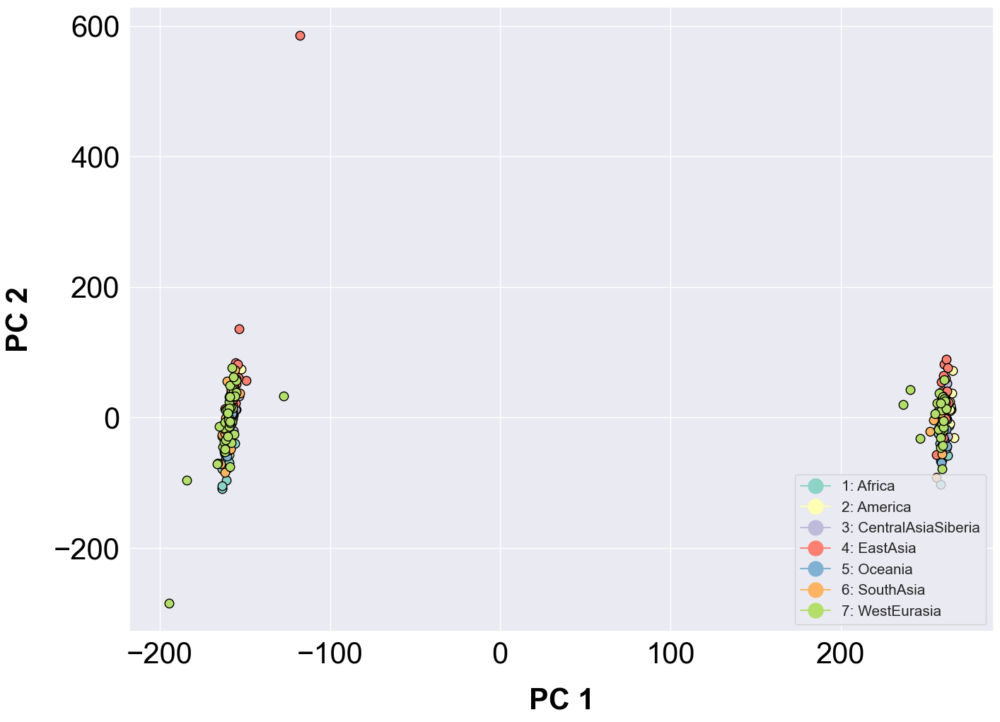

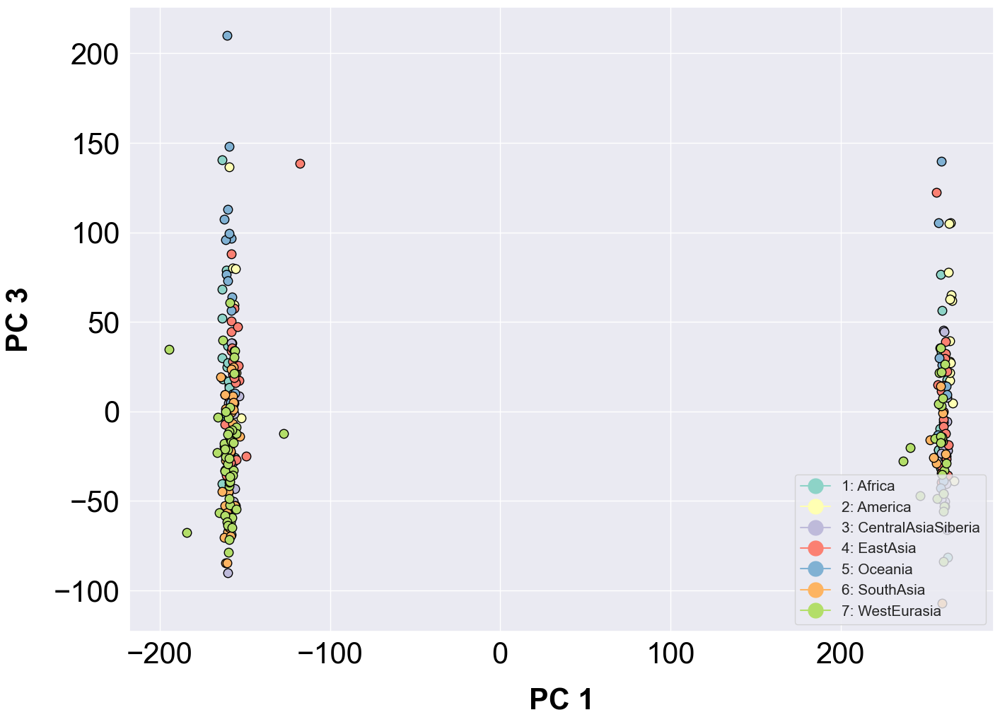

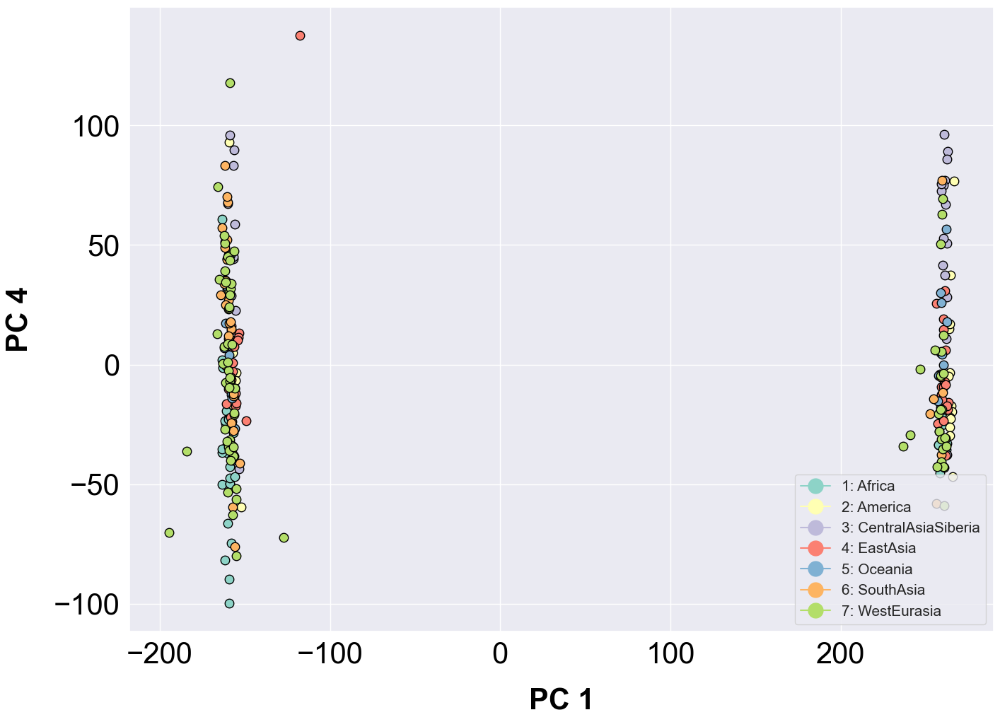

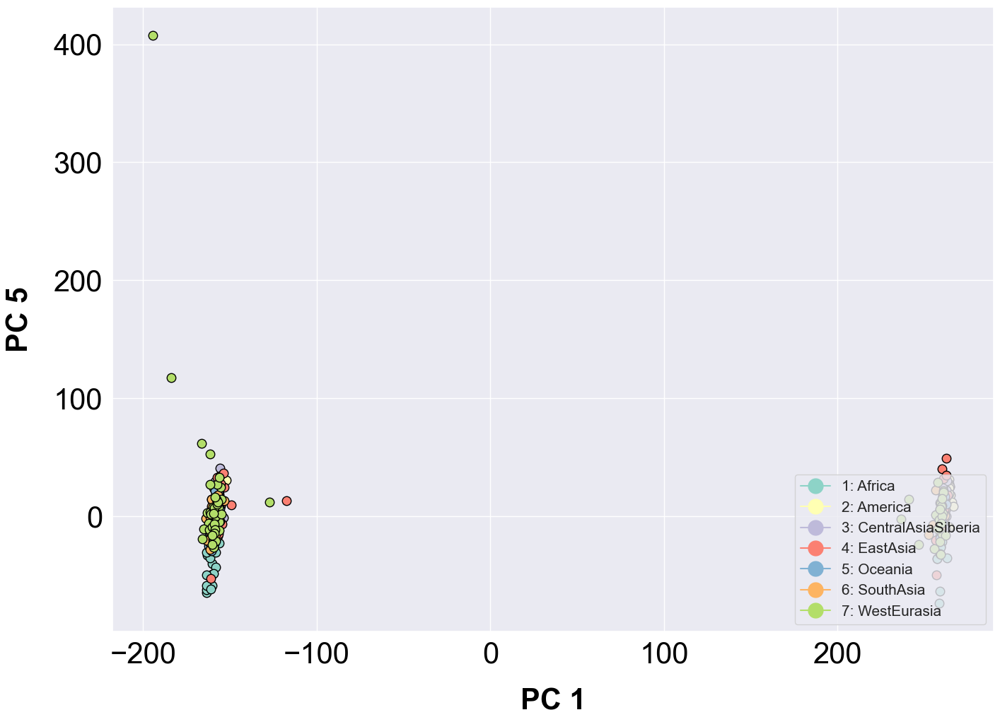

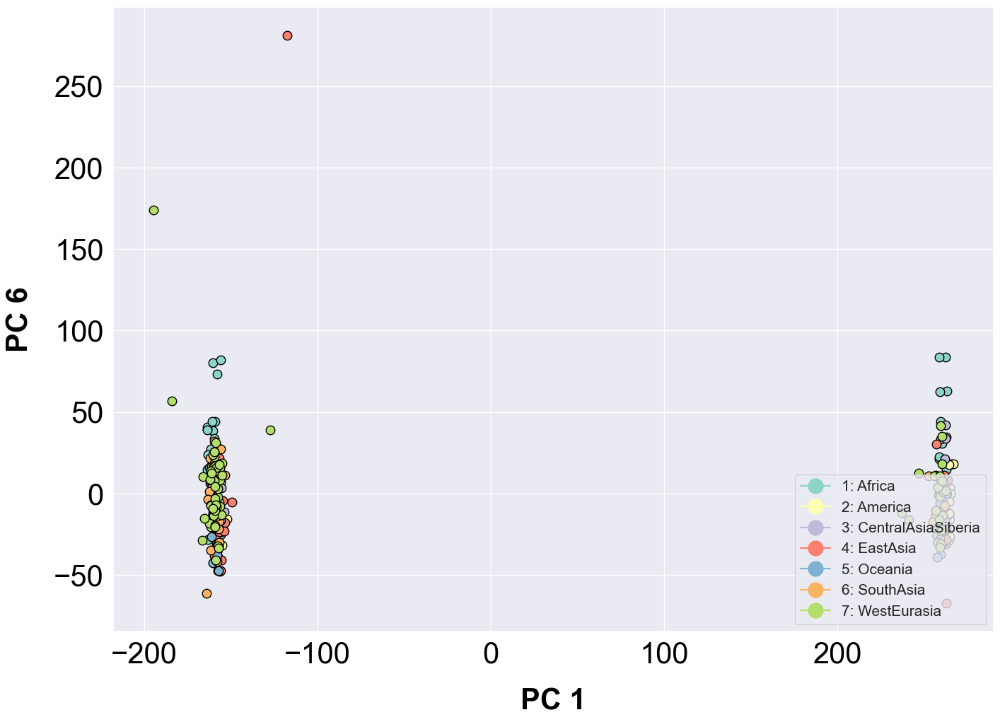

...

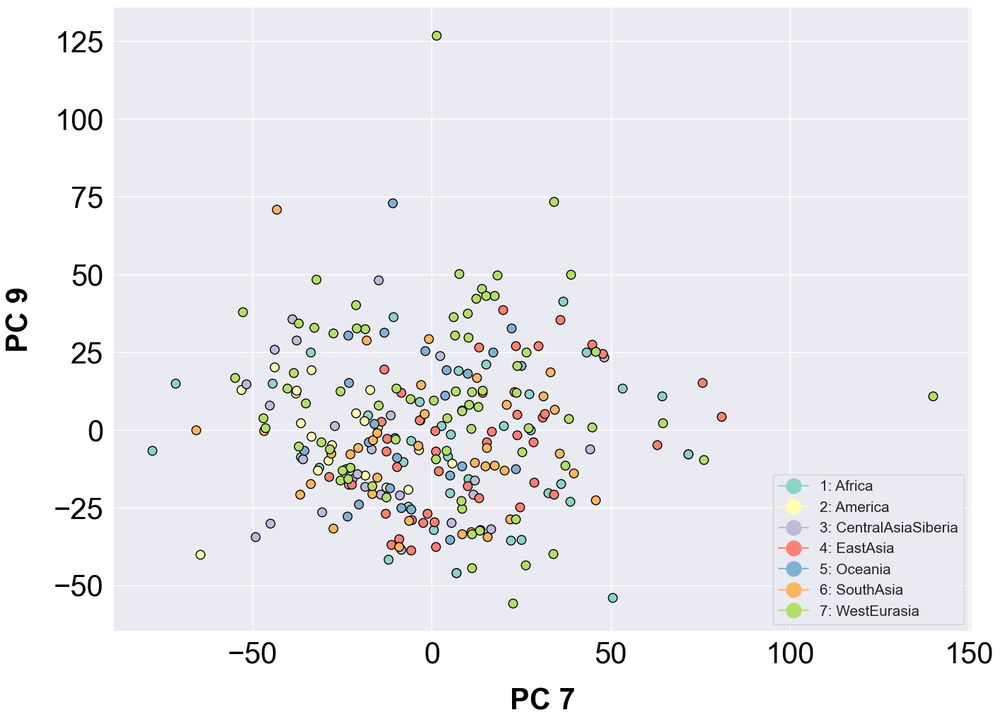

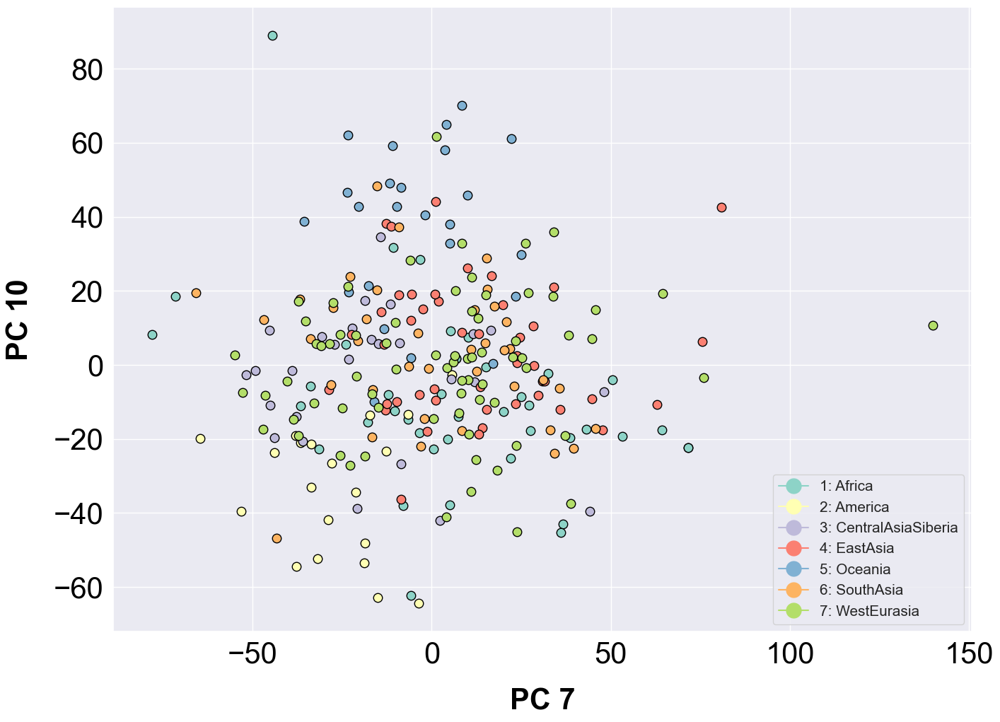

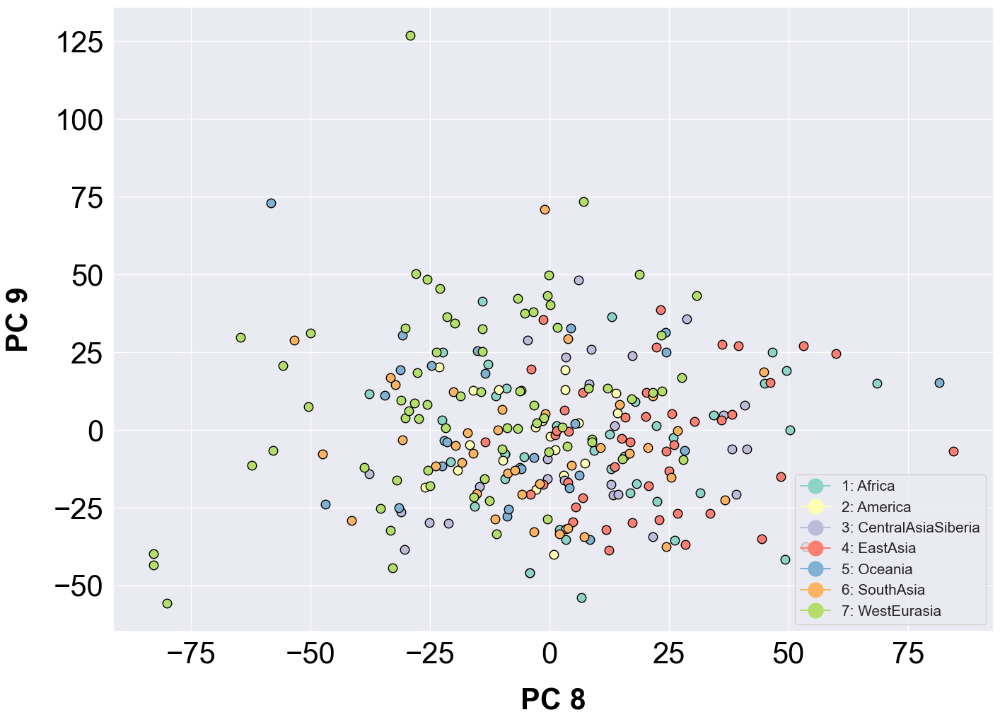

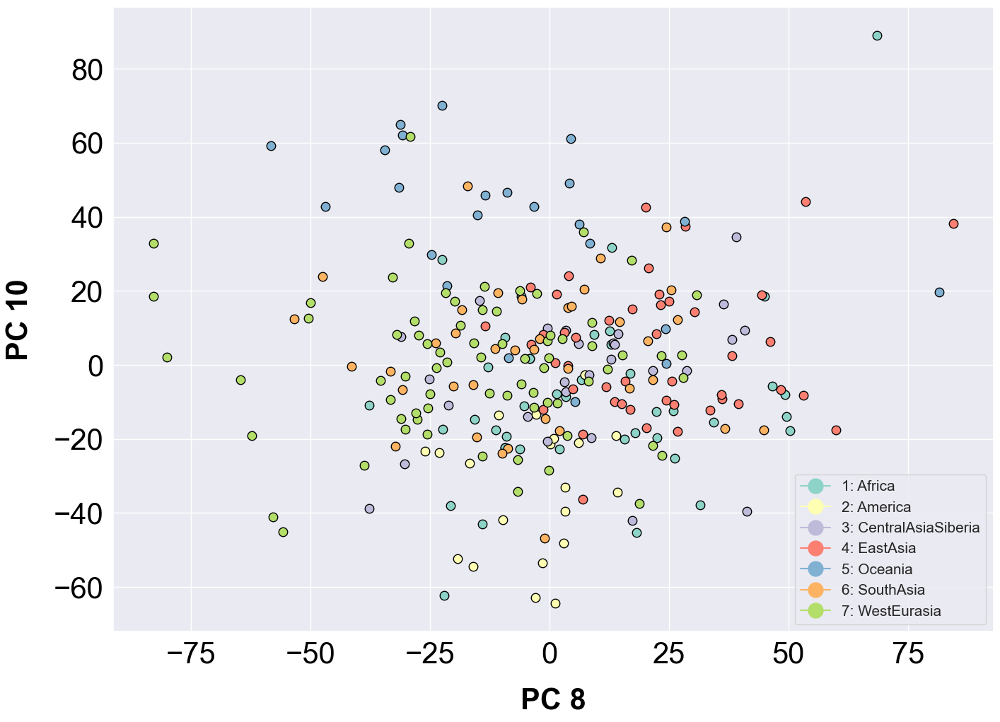

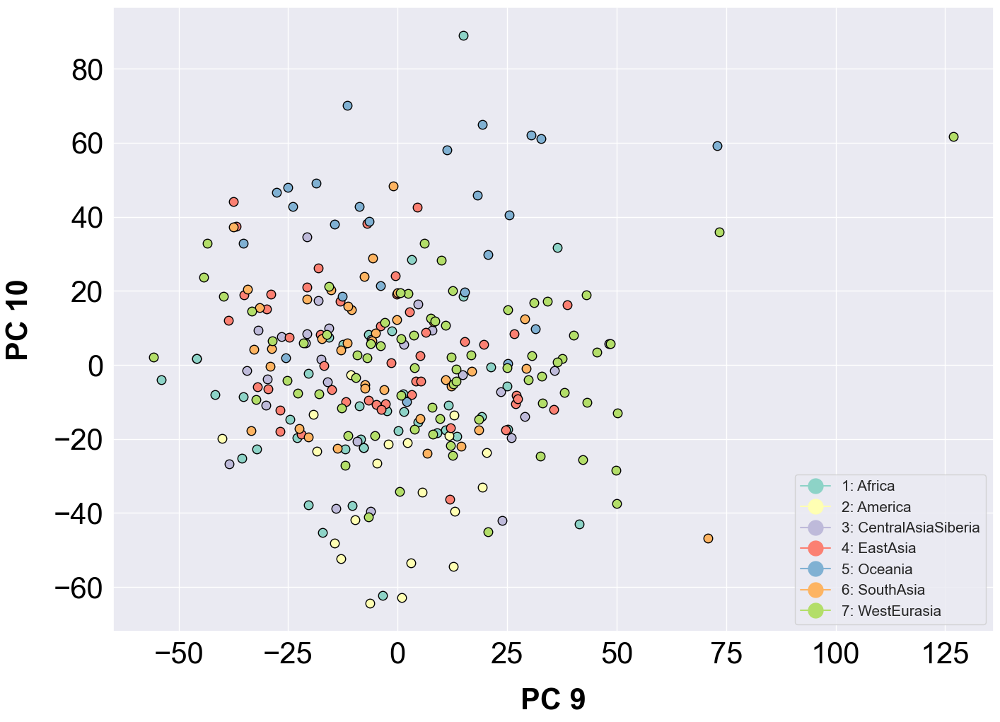

In [41]:
components = [1,2,3,4,5,6,7,8,9,10]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='REGION', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))

<h1> Permutation

In [33]:
p_value_permutation = []

combination_regions = list(combinations([0,1,2,3,4,5,6],2)) 
for region in combination_regions:
    p_value= []
    p_value_permutation.append(p_value)
    
    for i in range(623957):
        permutation = PermutationTest(dt_groupped[region[0]][i], dt_groupped[region[1]][i], stat=vst, n_perm=9999)#mean_gt
        p_value.append(permutation.p_value())

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/vst_function.py:44: RuntimeWarning: invalid value encountered in double_scalars
  vst = (vt-vs)/vt


KeyboardInterrupt: 

In [7]:
## PERMUTATION #####
p_value_permutation = []

combination_regions = list(combinations([0,1,2,3,4,5,6],2))


def permutation(lenght_cnvs):
    p_value_permutation = []
    combination_regions = list(combinations([0,1,2,3,4,5,6],2))
    for region in combination_regions:
        p_value= []
        p_value_permutation.append(p_value)
        
        for i in lenght_cnvs:
            permutation = PermutationTest(dt_groupped[region[0]][i], dt_groupped[region[1]][i], stat=vst, n_perm=9999)#mean_gt
            p_value.append(permutation.p_value())
    permutation_vst_chm13_deletions_gene_regions = pd.DataFrame(p_value_permutation).set_axis(combination_names)

    return permutation_vst_chm13_deletions_gene_regions
    

total_cnvs = range(1014257)

# create a process pool that uses all cpus
with multiprocessing.Pool() as pool:
    for result in pool.map(permutation, total_cnvs):
        result.to_csv('permutation_vst_chm13_all_cnvs.csv')



Process SpawnPoolWorker-1:
Traceback (most recent call last):
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/pool.py", line 114, in worker
    task = get()
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/queues.py", line 367, in get
    return _ForkingPickler.loads(res)
AttributeError: Can't get attribute 'permutation' on <module '__main__' (built-in)>
Process SpawnPoolWorker-2:
Traceback (most recent call last):
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  

Process SpawnPoolWorker-14:
Traceback (most recent call last):
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/pool.py", line 114, in worker
    task = get()
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/queues.py", line 367, in get
    return _ForkingPickler.loads(res)
AttributeError: Can't get attribute 'permutation' on <module '__main__' (built-in)>
Process SpawnPoolWorker-15:
Traceback (most recent call last):
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)


Process SpawnPoolWorker-27:
Traceback (most recent call last):
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/pool.py", line 114, in worker
    task = get()
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/queues.py", line 367, in get
    return _ForkingPickler.loads(res)
AttributeError: Can't get attribute 'permutation' on <module '__main__' (built-in)>
Process SpawnPoolWorker-28:
Traceback (most recent call last):
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)


KeyboardInterrupt: 

In [6]:
import multiprocessing

In [10]:
permutation(range(5))

NameError: name 'dt_groupped' is not defined

In [43]:
with multiprocessing.Pool() as pool:
    for result in pool.map(permutation, range(10)):
        result.to_csv('permutation_vst_chm13_all_cnvs.csv')

Process SpawnPoolWorker-17:
Process SpawnPoolWorker-18:
Process SpawnPoolWorker-19:
Process SpawnPoolWorker-21:
Process SpawnPoolWorker-20:
Process SpawnPoolWorker-23:
Process SpawnPoolWorker-22:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
Traceback (most recent call last):
Traceback (most recent call last):
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/pool.py", line 114, in worker
    task = get()


KeyboardInterrupt: 

In [46]:
from multiprocessing import Pool

if __name__ == '__main__':
    with Pool(5) as p:
        print(p.map(permutation, range(10)))

Process SpawnPoolWorker-50:
Process SpawnPoolWorker-51:
Traceback (most recent call last):
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/pool.py", line 114, in worker
    task = get()
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/queues.py", line 367, in get
    return _ForkingPickler.loads(res)
AttributeError: Can't get attribute 'permutation' on <module '__main__' (built-in)>
Process SpawnPoolWorker-52:
Process SpawnPoolWorker-53:
Traceback (most recent call last):
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
  File "/Users/luciabazan/opt/anaconda3/lib/python3.9/multiprocessing/process.py", line 10

KeyboardInterrupt: 

In [ ]:
def cube(x):
    return x**3
 
if __name__ == "__main__":
    # this does not work
    processes = [multiprocessing.Process(target=cube, args=(x,)) for x in range(1,1000)]
    [p.start() for p in processes]
    result = [p.join() for p in processes]
    print(result)

In [54]:
processes = [multiprocessing.Process(target=vst_function.permutation, args=(lenght_cnvs,)) for lenght_cnvs in range(5)]
[p.start() for p in processes]
result = [p.join() for p in processes]
print(result)

AttributeError: module 'vst_function' has no attribute 'permutation'

In [15]:
import permutation_chm13

In [18]:
permutation_chm13(4)

TypeError: 'module' object is not callable